In [1]:
import pandas as pd
import numpy as np
from plotly.offline import init_notebook_mode, iplot
import cufflinks as cf
init_notebook_mode()
cf.go_offline()


In [2]:
# Import data


ft = pd.read_csv('free_throws.csv')
ft['season'] = 's' + ft.season.str.replace(' - 20', '-')
ft.head()


,end_result,game,game_id,period,play,player,playoffs,score,season,shot_made,time
0,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum makes free throw 1 of 2,Andrew Bynum,regular,0 - 1,s2006-07,1,11:45
1,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum makes free throw 2 of 2,Andrew Bynum,regular,0 - 2,s2006-07,1,11:45
2,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum makes free throw 1 of 2,Andrew Bynum,regular,18 - 12,s2006-07,1,7:26
3,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum misses free throw 2 of 2,Andrew Bynum,regular,18 - 12,s2006-07,0,7:26
4,106 - 114,PHX - LAL,261031013.0,1.0,Shawn Marion makes free throw 1 of 1,Shawn Marion,regular,21 - 12,s2006-07,1,7:18


In [3]:
# Group seasons to simplify analysis


def seasons(s):
    SEASONS_dict = {'S2006-09': ['s2006-07', 's2007-08', 's2008-09',
                                 's2009-10'],
                    'S2009-12': ['s2010-11', 's2011-12', 's2012-13'],
                    'S2012-15': ['s2013-14', 's2014-15', 's2015-16']
                    }
    for key in SEASONS_dict:
        if s in SEASONS_dict[key]:
            S = key
    return S

ft['SEASONS'] = ft.season.apply(lambda x: seasons(x))


In [4]:
# import player data to identify team


player = pd.read_csv('all_seasons.csv', index_col=0)
player = player[(player.season.str[:4].astype(int) > 2005) &
                (player.season.str[:4].astype(int) < 2016)]
player = player[['player_name', 'team_abbreviation', 'season']]
player['season'] = player.season.str.replace('20', 's20')
player = player.rename(columns={'team_abbreviation': 'team_chance',
                       'player_name': 'player'})
player.head()


,player,team_chance,season
4430,Vince Carter,NJN,s2006-07
4431,Pape Sow,TOR,s2006-07
4432,Zaza Pachulia,ATL,s2006-07
4433,Eduardo Najera,DEN,s2006-07
4434,Elton Brand,LAC,s2006-07


In [5]:
# Adding which team chance / score in the table


ft = ft.merge(player, how='left', left_on=['player', 'season'],
              right_on=['player', 'season'])


In [6]:
# Identify the winning team


def who_win(result, teams):
    scores = [int(x) for x in result.split(' - ')]
    win = scores.index(max(scores))
    return teams.split(' - ')[win]

ft['team_won'] = ft.apply(lambda x: who_win(x.end_result, x.game), axis=1)
ft.head()


,end_result,game,game_id,period,play,player,playoffs,score,season,shot_made,time,SEASONS,team_chance,team_won
0,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum makes free throw 1 of 2,Andrew Bynum,regular,0 - 1,s2006-07,1,11:45,S2006-09,LAL,LAL
1,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum makes free throw 2 of 2,Andrew Bynum,regular,0 - 2,s2006-07,1,11:45,S2006-09,LAL,LAL
2,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum makes free throw 1 of 2,Andrew Bynum,regular,18 - 12,s2006-07,1,7:26,S2006-09,LAL,LAL
3,106 - 114,PHX - LAL,261031013.0,1.0,Andrew Bynum misses free throw 2 of 2,Andrew Bynum,regular,18 - 12,s2006-07,0,7:26,S2006-09,LAL,LAL
4,106 - 114,PHX - LAL,261031013.0,1.0,Shawn Marion makes free throw 1 of 1,Shawn Marion,regular,21 - 12,s2006-07,1,7:18,S2006-09,PHX,LAL


In [7]:
# identify home team and away team


ft['team_home'] = ft.game.str.split().str[0]
ft['team_away'] = ft.game.str.split().str[-1]


In [8]:
# Team rename:
# Oklahoma City Thunder (OKC) = Seattle SuperSonics (SEA)
# Brooklyn Nets (BKN) = New Jersey Nets (NJ)


ft = ft.replace({'SEA': 'OKC', 'NJ': 'BKN'})


In [9]:
# Remove WEST and EAST as they are not NBA teams


ft = ft[~ft.team_home.isin(['WEST', 'EAST'])]


In [10]:
# Separate regular and playoffs


ft_r = ft[ft.playoffs == 'regular']
ft_p = ft[ft.playoffs == 'playoffs']


In [11]:
ft[(ft.team_chance == ft.team_home) |
   (ft.team_chance == ft.team_away)][['game', 'team_chance']]


,game,team_chance
0,PHX - LAL,LAL
1,PHX - LAL,LAL
2,PHX - LAL,LAL
3,PHX - LAL,LAL
4,PHX - LAL,PHX
...,...,...
618122,DAL - OKC,OKC
618123,DAL - OKC,OKC
618124,DAL - OKC,OKC
618125,DAL - OKC,DAL


In [12]:
# data cleaning - players' team not in the teams of the game


team_dict = {'GSW': 'GS',
             'NOK': 'NO',
             'UTA': 'UTAH',
             'SAS': 'SA',
             'NYK': 'NY',
             'WAS': 'WSH',
             'NJN': 'BKN'}

ft = ft.replace(team_dict)


In [13]:
len(ft[(ft.team_chance != ft.team_home) &
    (ft.team_chance != ft.team_away)]) / len(ft)


0.09789289702383842

However, there are around 10% that it is unclear which team score it, although it is possible to identify them by compare the score below, however, there are possibility that only one free throw is given so this method may introduce other errors. For this reason, we will remove those points in the team performance analysis.

We assume that the unidentify points are evenly distribute to the teams and it has minimum affect to the team free throw accuracy analysis.

# Overall statistics

In [14]:
(ft.drop_duplicates(subset=['game', 'season'], keep='first').season.
 value_counts().sort_index()).iplot(kind='bar', xTitle='Season',
                                    yTitle='No. of games',
                                    title='NBA games each season')

# 2011-12 season play much fewer game


In [15]:
all_season = pd.DataFrame(ft.season.value_counts().sort_index())
all_season = all_season.rename(columns={'season': 'free_throw_chance'})
all_season['free_throw_score'] = ft[ft.shot_made == 1
                                    ].season.value_counts().sort_index()
all_season.iplot(kind='bar', xTitle='Season', yTitle='Chance/Score',
                 title='NBA free throw chance & score')


In [16]:
ft.groupby(['season', 'playoffs']).count().max(1).unstack()


playoffs,playoffs,regular
season,,
s2006-07,4116,63474
s2007-08,4384,61135
s2008-09,4455,60866
s2009-10,4447,60322
s2010-11,4185,59898
s2011-12,3972,44449
s2012-13,4078,54334
s2013-14,4389,57920
s2014-15,4049,56082


2011-12 season has much lower free throws because of much fewer games played.

# The importance of free throw change from seasons 2006-07 to 2015-16

In [17]:
# the percentage of free throws score in each season


ft_g = ft.drop_duplicates(['game_id'], keep='first')
ft_g['total_score'] = ft_g.end_result.apply(lambda x: sum([int(x)
                                            for x in (x.split(' - '))]))
(ft.groupby(['season']).shot_made.sum() / ft_g.groupby(['season']).total_score.
 sum()).iplot(title='Percentage of free throws score in each season',
              yTitle='Percentage',
              xTitle='Season')


In [18]:
(ft.groupby(['season', 'playoffs']).shot_made.sum().unstack() /
 ft_g.groupby(['season', 'playoffs']).total_score.sum().
 unstack()).iplot(title='Percentage of free throws score in each season',
                  yTitle='Percentage', xTitle='Seasons')


Overall, the importance of free throw is decreasing over time but it is more important during playoffs than regular seasons.

# When is free throw become important?

In [19]:
(ft_r[ft_r.period < 5].groupby(['period', 'SEASONS']).count().max(1).
 unstack() / ft_r[ft_r.period < 5].drop_duplicates('game_id').SEASONS.
 value_counts()).iplot(kind='bar', xTitle='Quarters',
                       yTitle='no. of free throw chances',
                       title='Average number of free throw chance in a\
                              game (regular)')

(ft_p[ft_p.period < 5].groupby(['period', 'SEASONS']).count().max(1).
 unstack() / ft_p[ft_p.period < 5].drop_duplicates('game_id').SEASONS.
 value_counts()).iplot(kind='bar', xTitle='Quarters',
                       yTitle='no. of free throw chances',
                       title='Average number of free throw chance in a\
                              game (playoffs)')


In [20]:
# Convert time to seconds


def min2sec(t):
    time = [int(i) for i in t.split(':')]
    return time[0]*60 + time[1]

ft_r['tl'] = ft_r.time.apply(min2sec)
ft_p['tl'] = ft_p.time.apply(min2sec)


In [21]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Histogram(x=ft_r[ft_r.SEASONS == 'S2006-09'].tl,
                           nbinsx=20, name='S2006-09'))
fig.add_trace(go.Histogram(x=ft_r[ft_r.SEASONS == 'S2009-12'].tl,
                           nbinsx=20, name='S2009-12'))
fig.add_trace(go.Histogram(x=ft_r[ft_r.SEASONS == 'S2012-15'].tl,
                           nbinsx=20, name='S2012-15'))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.5)


In [22]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=ft_p[ft_p.SEASONS == 'S2006-09'].tl,
              nbinsx=20, name='S2006-09'))
fig.add_trace(go.Histogram(x=ft_p[ft_p.SEASONS == 'S2009-12'].tl,
              nbinsx=20, name='S2009-12'))
fig.add_trace(go.Histogram(x=ft_p[ft_p.SEASONS == 'S2012-15'].tl,
              nbinsx=20, name='S2012-15'))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.5)

fig.update_layout(
    title_text='Free throws during a quarter (playoffs)',  # title of plot
    xaxis_title_text='Time remaining (secords)',  # xaxis label
    yaxis_title_text='Count',  # yaxis label
)
fig.show()
fig.update_layout(
    title_text='Free throws during a quarter (regular)',  # title of plot
    xaxis_title_text='Time remaining (secords)',  # xaxis label
    yaxis_title_text='Count',  # yaxis label
)
fig.show()


There are many free throws chance toward the end of a quarter.

# Teams winning statistics (regular)

In [23]:
# team winning analysis


game_result_r = ft_r.drop_duplicates('game_id')[['end_result', 'game',
                                                 'game_id', 'season',
                                                 'SEASONS', 'playoffs',
                                                 'team_home', 'team_away',
                                                 'team_won']]
game_result_r.head()


,end_result,game,game_id,season,SEASONS,playoffs,team_home,team_away,team_won
0,106 - 114,PHX - LAL,261031013.0,s2006-07,S2006-09,regular,PHX,LAL,LAL
41,108 - 66,CHI - MIA,261031014.0,s2006-07,S2006-09,regular,CHI,MIA,CHI
95,91 - 87,NO - BOS,261101002.0,s2006-07,S2006-09,regular,NO,BOS,NO
167,94 - 97,WSH - CLE,261101005.0,s2006-07,S2006-09,regular,WSH,CLE,CLE
226,105 - 97,MIL - DET,261101008.0,s2006-07,S2006-09,regular,MIL,DET,MIL


In [24]:
# Winning percentage

winning_percentage_r = (game_result_r.groupby(['season']).team_won.
                        value_counts().unstack() /
                        (game_result_r.groupby(['season']).team_home.
                         value_counts().unstack() +
                         game_result_r.groupby(['season']).team_away.
                         value_counts().unstack()))

# winning_percentage_r

team_season_r = winning_percentage_r.reset_index().melt(id_vars=['season'])
team_season_r['TS'] = team_season_r.season + '_' + team_season_r.team_won
(team_season_r.set_index('TS').value.sort_values().
 iplot(kind='bar', title='Winning percentage', yTitle='Percentage',
       xTitle='Season team'))


In [25]:
winning_percentage_r = (game_result_r.groupby(['SEASONS']).team_won.
                        value_counts().unstack() /
                        (game_result_r.groupby(['SEASONS']).team_home.
                         value_counts().unstack() +
                         game_result_r.groupby(['SEASONS']).team_away.
                         value_counts().unstack()))

team_SEASONS_r = winning_percentage_r.reset_index().melt(id_vars=['SEASONS'])
team_SEASONS_r['TS'] = team_SEASONS_r.SEASONS + '_' + team_SEASONS_r.team_won
(team_SEASONS_r.set_index('TS').value.sort_values().
 iplot(kind='bar', title='Winning percentage (seasons)', yTitle='Percentage',
 xTitle='SEASONS team'))


In [26]:
team_season_r = team_season_r.rename(columns={'value': 'winning_percent'})
team_SEASONS_r = team_SEASONS_r.rename(columns={'value': 'winning_percent'})


# Teams performance analysis

In [27]:
len(ft)


617910

In [28]:
ft_pa = ft[~((ft.team_chance != ft.team_home) &
           (ft.team_chance != ft.team_away))]
len(ft_pa)


557421

In [29]:
ft_pa_r = ft_pa[ft_pa.playoffs == 'regular']
ft_pa_p = ft_pa[ft_pa.playoffs == 'playoffs']


In [30]:
# Conversion rate of free throw


free_throw_acc_r = (ft_pa_r.groupby(['SEASONS', 'team_chance']).shot_made.
                    sum().unstack() /
                    ft_pa_r.groupby(['SEASONS', 'team_chance']).count().
                    max(1).unstack())
free_throw_acc_r.head()


team_chance,ATL,BKN,BOS,CHA,CHI,CLE,DAL,DEN,DET,GS,...,OKC,ORL,PHI,PHX,POR,SA,SAC,TOR,UTAH,WSH
SEASONS,,,,,,,,,,,,,,,,,,,,,
S2006-09,0.758224,0.757629,0.762986,0.735113,0.765355,0.722648,0.818506,0.757310,0.757996,0.762049,...,0.791607,0.708199,0.739409,0.781279,0.772003,0.750315,0.774825,0.794065,0.755249,0.770113
S2009-12,0.742236,0.752446,0.778013,0.757466,0.746843,0.740308,0.776686,0.718382,0.725730,0.784387,...,0.821127,0.684408,0.747273,0.757212,0.807108,0.769450,0.751006,0.769913,0.754258,0.730133
S2012-15,0.778486,0.752990,0.772238,0.756454,0.781046,0.751002,0.780127,0.759860,0.675220,0.767657,...,0.784695,0.750054,0.692324,0.756480,0.794118,0.790138,0.747674,0.776462,0.735856,0.736628


In [31]:
team_acc_r = free_throw_acc_r.reset_index().melt(id_vars=['SEASONS'])
team_acc_r['TS'] = team_acc_r.SEASONS + '_' + team_acc_r.team_chance
team_acc_r = team_acc_r.rename(columns={'value': 'FT_acc'})
# team_acc_r

team_performance = team_SEASONS_r.merge(team_acc_r[['TS', 'FT_acc']])
display(team_performance)

fig = team_performance.iplot(kind='scatter', mode='markers', x="FT_acc",
                             y="winning_percent", categories='SEASONS',
                             text='TS', yTitle='winning percentage',
                             xTitle='Free throw accuracy',
                             title='Relationship between free throw accuracy \
                                    and winning percentage',
                             asFigure=True)


,SEASONS,team_won,winning_percent,TS,FT_acc
0,S2006-09,ATL,0.513846,S2006-09_ATL,0.758224
1,S2009-12,ATL,0.556522,S2009-12_ATL,0.742236
2,S2012-15,ATL,0.595918,S2012-15_ATL,0.778486
3,S2006-09,BKN,0.368098,S2006-09_BKN,0.757629
4,S2009-12,BKN,0.410480,S2009-12_BKN,0.752446
...,...,...,...,...,...
85,S2009-12,UTAH,0.513043,S2009-12_UTAH,0.754258
86,S2012-15,UTAH,0.420408,S2012-15_UTAH,0.735856
87,S2006-09,WSH,0.391437,S2006-09_WSH,0.770113
88,S2009-12,WSH,0.313043,S2009-12_WSH,0.730133


/Users/calvincheung/anaconda3/envs/ds37/lib/python3.7/site-packages/cufflinks/plotlytools.py:808: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead

/Users/calvincheung/anaconda3/envs/ds37/lib/python3.7/site-packages/cufflinks/plotlytools.py:811: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



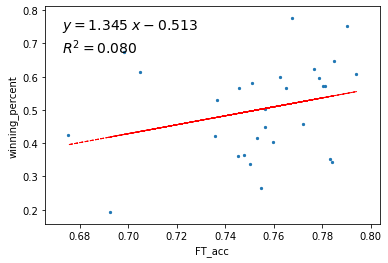

In [32]:
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

(team_performance[team_performance.SEASONS == 'S2012-15'].plot.
 scatter(x='FT_acc', y='winning_percent', marker='.'))

team_performance2 = team_performance[team_performance.SEASONS ==
                                     'S2012-15'].dropna()
# team_performance2 = team_performance2[team_performance2.FT_acc > 0.7]

z = np.polyfit(team_performance2.FT_acc,
               team_performance2.winning_percent, 1)
y_hat = np.poly1d(z)(team_performance2.FT_acc)

plt.plot(team_performance2.FT_acc, y_hat, "r--", lw=1)
text = f"$y={z[0]:0.3f}\;x{z[1]:+0.3f}$\n$R^2 = \
       {r2_score(team_performance2.winning_percent,y_hat):0.3f}$"
plt.gca().text(0.05, 0.95, text, transform=plt.gca().transAxes,
               fontsize=14, verticalalignment='top')

fig.update_layout(xaxis_range=[0.65, 0.85])
fig.update_layout(yaxis_range=[0.15, 0.8])
fig


In [33]:
team_improvement = winning_percentage_r.T
team_improvement['improve'] = (team_improvement['S2012-15'] -
                               team_improvement['S2006-09'])
team_improvement = team_improvement.sort_values('improve', ascending=False)
top_improving_teams = team_improvement.head().index.tolist()
top_improving_teams


['GS', 'LAC', 'MEM', 'OKC', 'IND']

In [34]:
free_throw_acc_r[top_improving_teams].T.iplot(kind='bar', yrange=[0.6, 0.9],
                                              title='Trends of free throw \
                                              accuracy in top improving teams',
                                              yTitle='% accuracy',
                                              xTitle='Teams')
winning_percentage_r[top_improving_teams].T.iplot(kind='bar',
                                                  title='Trends of game \
                                                  winning percentage in top\
                                                  improving teams',
                                                  yTitle='% accuracy',
                                                  xTitle='Teams')